In [1]:
import os
import tifffile
import matplotlib.pyplot as plt
from skimage.measure import find_contours
from skimage.draw import polygon
from matplotlib.collections import LineCollection
import pandas as pd
import numpy as np
import seaborn as sns
import json
from collections import defaultdict
from mmtrack import plot_cells

In [2]:
def plot_all_functions(experiment):
    base_path =f'/Volumes/mcovert/Instruments/Covert-lab-scope1/subgen_processed_data/{experiment}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted'
    path_to_fluor_stack_dir=f'{base_path}/fluor_kymos'
    path_to_phase_stack_dir=f'{base_path}'
    path_to_labels_stack_dir =f'{base_path}/mask_kymos'
    phase_list = os.listdir(path_to_phase_stack_dir)
    mask_list =os.listdir(path_to_labels_stack_dir)
    fluor_list =os.listdir(path_to_fluor_stack_dir)
    tab20_cmap = plt.get_cmap("tab20")


    for file_name in mask_list:
        if file_name in phase_list and file_name in fluor_list:
            base_name = file_name.replace('.tif', '')
            path_to_mask_stack = f'{path_to_labels_stack_dir}/{file_name}'
            path_to_phase_stack = f'{path_to_phase_stack_dir}/{file_name}'
            path_to_fluor_stack =f'{path_to_fluor_stack_dir}/{file_name}'
            
            phase_kymograph=tifffile.imread(path_to_phase_stack)
            fluor_kymograph=tifffile.imread(path_to_fluor_stack)
            mask_kymograph=tifffile.imread(path_to_mask_stack)

            colored_mask = np.zeros((*mask_kymograph.shape, 4), dtype=np.float32)  
            unique_labels = np.unique(mask_kymograph)
            for label in unique_labels:
                if label > 0: 
                    mask_indices = (mask_kymograph == label)
                    colored_mask[mask_indices, :3] = tab20_cmap(label % 20)[:3]  
                    colored_mask[mask_indices, 3] = 1.0  

            plt.figure(figsize=(12, 8))

            plt.subplot(1, 3, 1)
            plt.imshow(phase_kymograph, cmap='gray')
            plt.title(f'Phase {base_name}')
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(phase_kymograph, cmap='gray')  
            plt.imshow(colored_mask, alpha=0.5)  
            plt.title(f'Mask {base_name}')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(fluor_kymograph, cmap='gray')  
            plt.title(f'Fluor {base_name}')
            plt.axis('off')
            
            # Show the plot
            plt.show()        

In [14]:
# function used to aid in plotting kymographs 
def plot_kymograph_cells_id(phase_kymograph, fluor_kymograph, full_region_df, folder, fov_id, peak_id, track_id_col='track_id'):
    fig, ax = plt.subplots(1,1, figsize=(40, 10))

    # Get kymograph shape once for both calls
    kymograph_shape = phase_kymograph.shape
    print(kymograph_shape)

    ax.imshow(phase_kymograph, cmap = 'grey')
    plot_cells._plot_cell_masks(ax, full_region_df, kymograph_shape, y_coord_col = 'centroid_y', x_coord_col = 'centroid_x', lineage_col = track_id_col)
    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_title(f'Phase Kymograph - {folder} FOV: {fov_id}, trench: {peak_id}')

    plt.xlabel("Time frames")
    plt.tight_layout()

    plt.show()

def plot_kymographs(base_dir, df_for_kymograph_plot):
    """Helper function to load kymograph images and plot predicted lineages."""
    print("\n--- Plotting Predicted Lineages on Kymographs ---")

    # Use pandas to get unique experiment/FOV/trench combinations
    unique_views = df_for_kymograph_plot[['experiment_name', 'FOV', 'trench_id']].drop_duplicates()

    if unique_views.empty:
        print("No unique views to plot.")
        return

    for index, cell_view in unique_views.iterrows():
        exp, fov, trench = cell_view['experiment_name'], cell_view['FOV'], cell_view['trench_id']

        # Path construction based on Stage 4's expected output
        kymo_base_path = os.path.join(base_dir, exp, 'hyperstacked', 'drift_corrected', 'rotated', 'mm_channels',
                                      'subtracted')

        # NOTE: Using the simple naming convention (e.g., '007_992.tif')
        path_to_phase_kymograph = os.path.join(kymo_base_path, f'{fov}_{trench}.tif')
        path_to_fluor_kymograph = os.path.join(kymo_base_path, 'fluor_kymos',
                                               f'{fov}_{trench}.tif')  # Assuming 'fluor' subdirectory

        # Fallback check for file existence
        if not (os.path.exists(path_to_phase_kymograph) and os.path.exists(path_to_fluor_kymograph)):
            print(f"  Skipping {exp}/{fov}/{trench}: Kymograph files not found.")
            continue

        print(f"  -> Plotting {exp}/{fov}/{trench}")

        phase_kymograph = tifffile.imread(path_to_phase_kymograph)
        fluor_kymograph = tifffile.imread(path_to_fluor_kymograph)

        df_view = df_for_kymograph_plot[
            (df_for_kymograph_plot['experiment_name'] == exp) &
            (df_for_kymograph_plot['FOV'] == fov) &
            (df_for_kymograph_plot['trench_id'] == trench)
            ].copy()

        plot_kymograph_cells_id(
            phase_kymograph, fluor_kymograph,
            df_view,
            exp, fov, trench,
            track_id_col='predicted_lineage'
        )


In [4]:
def detect_fluorescence_bursts_by_group(
    df: pd.DataFrame,
    fluor_col = 'intensity_mean_fluor',
    rolling_window_size: int = 6,
    std_dev_threshold: float = 2
) -> pd.DataFrame:
    """
    Detects fluorescence bursts for each unique experiment, FOV, and trench.

    Args:
        df (pd.DataFrame): The input DataFrame with 'experiment_name', 'FOV',
                           'trench_id', 'time_min', and 'mean_fluorescence' columns.
        rolling_window_size (int): The window size for the rolling filters
                                   (in number of time frames).
        std_dev_threshold (float): The number of standard deviations above the
                                   mean to be considered a significant burst.

    Returns:
        pd.DataFrame: The original DataFrame with new columns for burst detection.
    """
    processed_df_list = []

    # Group the DataFrame by the specified columns
    group_cols = ['gene', 'experiment_name', 'FOV']
    grouped_data = df.groupby(group_cols)

    for name, group in grouped_data:
        # Sort the group by time_frame to ensure rolling windows work correctly
        group = group.sort_values(by='time_frame')

        # Step 1: Baseline Subtraction (Local Baseline)
        group['local_min'] = group[fluor_col].rolling(
            window=rolling_window_size,
            min_periods=1,
            center=True
        ).min()
        
        group['normalized_fluorescence'] = group[fluor_col] - group['local_min']
        group['normalized_fluorescence'] = group['normalized_fluorescence'].clip(lower=0)

        # Step 2: Local Peak Detection
        group['local_max'] = group['normalized_fluorescence'].rolling(
            window=rolling_window_size,
            min_periods=1,
            center=True
        ).max()
        
        group['is_local_peak'] = (group['normalized_fluorescence'] == group['local_max'])

        # Step 3: Statistical Thresholding
        std_dev = group['normalized_fluorescence'].std()
        mean_signal = group['normalized_fluorescence'].mean()
        
        threshold = mean_signal + (std_dev_threshold * std_dev)

        group['is_burst'] = (group['is_local_peak']) & (group['normalized_fluorescence'] > threshold)

        processed_df_list.append(group)

    result_df = pd.concat(processed_df_list).reset_index(drop=True)
    
    # Remove temporary columns
    result_df = result_df.drop(columns=['local_min', 'local_max', 'is_local_peak'])

    return result_df

def merge_dicts(dict1, dict2):
    merged = defaultdict(dict)
    
    for key in dict1.keys():
        if key in dict2:
            # Merge if key exists in both dictionaries
            for subkey, values in dict1[key].items():
                if subkey in dict2[key]:
                    # Combine the lists for subkey
                    merged[key][subkey] = list(set(values + dict2[key][subkey]))
                else:
                    merged[key][subkey] = values
            for subkey, values in dict2[key].items():
                if subkey not in merged[key]:
                    merged[key][subkey] = values
        else:
            merged[key] = dict1[key]
    
    for key in dict2.keys():
        if key not in merged:
            merged[key] = dict2[key]
    
    return dict(merged)

In [5]:
minutes_interval = {"DUMM_giTG62_Glucose_012925":5,
"DUMM_giTG66_Glucose_012325":5,
"DUMM_giTG059_noKan_Glucose_031125":5,
"DUMM_giTG059_060_061125":10,
"DUMM_giTG064_Glucose_022625":5,
"DUMM_giTG69_Glucose_013025":5,
"DUMM_giTG068_063_061725_v2":10,
"DUMM_giTG63_giTG67_Glucose_121724_1_v2":5,
"DUMM_giTG059_060_061125":10,
"DUMM_giTG068_052925":5,
"DUMM_giTG068_063_061725":10,
"DUMM_CL008_giTG061_081225":10,
"DUMM_alkA_chpS_111325":10,
"DUMM_giTG062_064_121325":10,
"DUMM_gitg068_baeS_100225":10,
"DUMM_baeS_gfcE_112025":10,
"DUMM_giTG066_063_120925":10,
"DUMM_giTG060_064_121425":10,
"DUMM_giTG069_063_121125":10,
"DUMM_giTG069_063_121225":10,
"DUMM_mazF_murQ_121625":10,
"DUMM_giTG059_068_SC_093025":10,
"CL008_giTG068_072925":10
}

combined_dict ={'chpS': {'DUMM_giTG62_Glucose_012925': ['005'], 'DUMM_alkA_chpS_111325': ['003', '005', '006', '007', '009', '010', '011'], 'DUMM_giTG062_064_121325': ['005', '010', '012']}, 'baeS': {'DUMM_giTG66_Glucose_012325': ['003'], 'DUMM_gitg068_baeS_100225': ['013', '017', '018', '019', '020', '021', '022', '023'], 'DUMM_baeS_gfcE_112025': ['005'], 'DUMM_giTG066_063_120925': ['002', '007']}, 'lacZ': {'DUMM_giTG059_noKan_Glucose_031125': ['004'], 'DUMM_giTG059_060_061125': ['008'], 'DUMM_giTG059_068_SC_093025': ['015', '020']}, 'gfcE': {'DUMM_giTG064_Glucose_022625': ['001', '015'], 'DUMM_baeS_gfcE_112025': ['011', '012', '016'], 'DUMM_giTG062_064_121325': ['015', '019'], 'DUMM_giTG060_064_121425': ['013', '014', '020', '022']}, 'gldA': {'DUMM_giTG69_Glucose_013025': ['007'], 'DUMM_giTG069_063_121125': ['013', '016', '022', '025'], 'DUMM_giTG069_063_121225': ['013', '018', '022']}, 'alkA': {'DUMM_giTG068_063_061725_v2': ['000'], 'DUMM_giTG63_giTG67_Glucose_121724_1_v2': ['006'], 'DUMM_alkA_chpS_111325': ['017', '018', '022', '023'], 'DUMM_giTG066_063_120925': ['018', '019'], 'DUMM_giTG069_063_121125': ['001', '005', '006', '008'], 'DUMM_giTG069_063_121225': ['000']}, 'mazF': {'DUMM_giTG059_060_061125': ['015'], 'DUMM_giTG060_064_121425': ['000', '005'], 'DUMM_mazF_murQ_121625': ['005', '006', '012']}, 'hupA': {'DUMM_giTG068_052925': ['005'], 'DUMM_giTG068_063_061725': ['012']}, 'araB': {'DUMM_CL008_giTG061_081225': ['015', '016', '017', '018', '019', '020'], 'CL008_giTG068_072925': ['003', '007', '009']}, 'murQ': {'DUMM_mazF_murQ_121625': ['017', '018']}} 

exposure_dict= {'CL008_giTG068_072925': [45, 150],
'DUMM_alkA_chpS_111325': [120, 150],
'DUMM_baeS_gfcE_112025': [120, 150],
'DUMM_CL008_giTG061_081225': [120, 150],
'DUMM_giTG059_060_061125': [250, 250],
'DUMM_giTG059_068_SC_093025': [120, 150],
'DUMM_giTG059_noKan_Glucose_031125': [250, 450],
'DUMM_giTG060_064_121425': [120, 150],
'DUMM_giTG062_064_121325': [120, 150],
'DUMM_giTG064_Glucose_022625': [250, 500],
'DUMM_giTG066_063_120925': [120, 150],
'DUMM_giTG068_052925': [250, 450],
'DUMM_giTG068_063_061725': [45, 150],
'DUMM_gitg068_baeS_100225': [120, 150],
'DUMM_giTG069_063_121125': [120, 150],
'DUMM_giTG069_063_121225': [120, 150],
'DUMM_giTG66_Glucose_012325': [250, 500],
'DUMM_giTG69_Glucose_013025': [250, 500],
'DUMM_mazF_murQ_121625': [120, 150],
'DUMM_giTG068_063_061725_v2': [45, 150],
'DUMM_giTG63_giTG67_Glucose_121724_1_v2': [250, 500],
'DUMM_giTG62_Glucose_012925': [250, 500]
}

genes = ['chpS', 'baeS', 'lacZ', 'gfcE', 'gldA', 'alkA', 'mazF', 'hupA', 'araB', 'murQ']


In [6]:
#load data files together 
path_all_lineages_df = '/Users/adrianjuarez/Documents/Covert_lab/Projects/Operon/tracked_all_cell_data_aggregate_032626.pkl'
path_all_cell_data_df = '/Users/adrianjuarez/Documents/Covert_lab/Projects/Operon/all_cell_data_aggregate_032626.pkl'

all_lineages_df = pd.read_pickle(path_all_lineages_df)
all_cell_data_df = pd.read_pickle(path_all_cell_data_df)


In [7]:
def detect_fluorescence_bursts_by_group_temp(
    df: pd.DataFrame,
    fluor_col = 'intensity_mean_fluor',
    rolling_window_size: int = 6,
    std_dev_threshold: float = 2,
    exposure_dict: dict = None,
    exposure_threshold_map: dict = None
) -> pd.DataFrame:
    """
    Detects fluorescence bursts for each unique experiment, FOV, and trench.

    Args:
        df (pd.DataFrame): The input DataFrame with 'experiment_name', 'FOV',
                           'trench_id', 'time_min', and 'mean_fluorescence' columns.
        fluor_col (str): Column name for fluorescence intensity.
        rolling_window_size (int): The window size for the rolling filters
                                   (in number of time frames).
        std_dev_threshold (float): The default number of standard deviations above the
                                   mean to be considered a significant burst.
        exposure_dict (dict): Dictionary mapping experiment names to [phase_exposure, fluor_exposure].
        exposure_threshold_map (dict): Dictionary mapping fluorescence exposure values to 
                                       std_dev_threshold values. If None, uses default mapping.

    Returns:
        pd.DataFrame: The original DataFrame with new columns for burst detection.
    """
    # Default exposure-to-threshold mapping if not provided
    if exposure_threshold_map is None:
        exposure_threshold_map = {
            150: 2.5,
            250: 3.0,
            450: 3.5,
            500: 4.0
        }
    
    processed_df_list = []

    # Group the DataFrame by the specified columns
    group_cols = ['gene', 'experiment_name', 'FOV']
    grouped_data = df.groupby(group_cols)

    for name, group in grouped_data:
        # Sort the group by time_frame to ensure rolling windows work correctly
        group = group.sort_values(by='time_frame')
        
        # Determine the std_dev_threshold for this experiment
        experiment_name = name[1]  # Extract experiment_name from groupby tuple
        current_threshold = std_dev_threshold  # Default threshold
        
        if exposure_dict is not None and experiment_name in exposure_dict:
            fluor_exposure = exposure_dict[experiment_name][1]  # Get fluorescence exposure
            
            # Map exposure to threshold
            if fluor_exposure in exposure_threshold_map:
                current_threshold = exposure_threshold_map[fluor_exposure]
            else:
                # Find closest exposure value if exact match not found
                closest_exposure = min(exposure_threshold_map.keys(), 
                                     key=lambda x: abs(x - fluor_exposure))
                current_threshold = exposure_threshold_map[closest_exposure]

        # Step 1: Baseline Subtraction (Local Baseline)
        group['local_min'] = group[fluor_col].rolling(
            window=rolling_window_size,
            min_periods=1,
            center=True
        ).min()
        
        group['normalized_fluorescence'] = group[fluor_col] - group['local_min']
        group['normalized_fluorescence'] = group['normalized_fluorescence'].clip(lower=0)

        # Step 2: Local Peak Detection
        group['local_max'] = group['normalized_fluorescence'].rolling(
            window=rolling_window_size,
            min_periods=1,
            center=True
        ).max()
        
        group['is_local_peak'] = (group['normalized_fluorescence'] == group['local_max'])

        # Step 3: Statistical Thresholding (using exposure-adjusted threshold)
        std_dev = group['normalized_fluorescence'].std()
        mean_signal = group['normalized_fluorescence'].mean()
        
        threshold = mean_signal + (current_threshold * std_dev)

        group['is_burst'] = (group['is_local_peak']) & (group['normalized_fluorescence'] > threshold)
        
        # Optional: Add a column to track which threshold was used
        group['std_dev_threshold_used'] = current_threshold

        processed_df_list.append(group)

    result_df = pd.concat(processed_df_list).reset_index(drop=True)
    
    # Remove temporary columns
    result_df = result_df.drop(columns=['local_min', 'local_max', 'is_local_peak'])

    return result_df

In [8]:
track_ided = all_lineages_df[all_lineages_df['track_id'].notnull()].copy()

In [9]:
print(track_ided['experiment_name'].unique())

['DUMM_giTG62_Glucose_012925' 'DUMM_giTG66_Glucose_012325'
 'DUMM_giTG059_noKan_Glucose_031125' 'DUMM_giTG064_Glucose_022625'
 'DUMM_giTG69_Glucose_013025' 'DUMM_giTG068_063_061725_v2'
 'DUMM_giTG63_giTG67_Glucose_121724_1_v2' 'DUMM_giTG059_060_061125'
 'DUMM_giTG068_052925' 'DUMM_giTG068_063_061725']



--- Plotting Predicted Lineages on Kymographs ---
  -> Plotting DUMM_giTG059_noKan_Glucose_031125/004/756
(345, 1920)


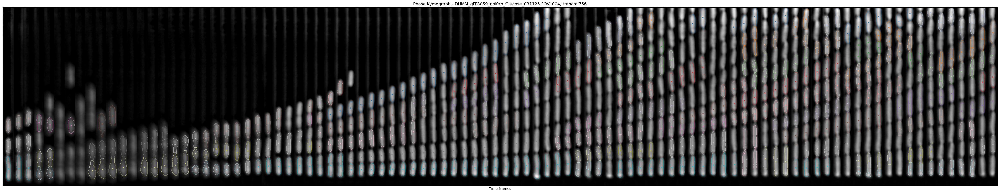

  -> Plotting DUMM_giTG059_noKan_Glucose_031125/004/832
(343, 2980)


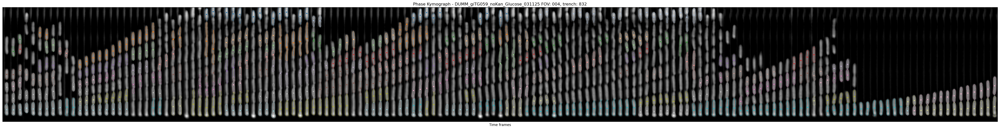

  -> Plotting DUMM_giTG059_noKan_Glucose_031125/004/72
(345, 1340)


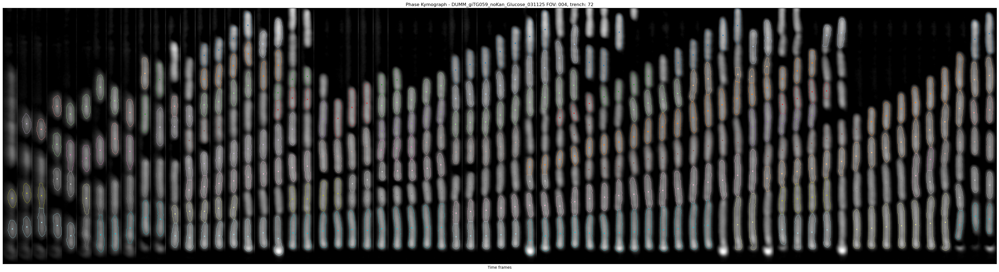

  -> Plotting DUMM_giTG059_noKan_Glucose_031125/004/1820
(360, 3000)


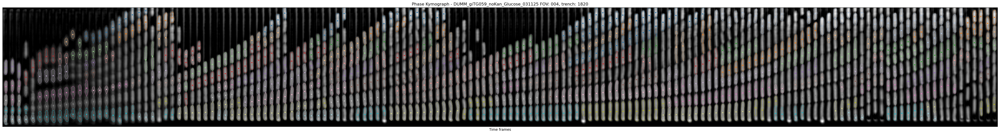

  -> Plotting DUMM_giTG059_noKan_Glucose_031125/004/985
(345, 1280)


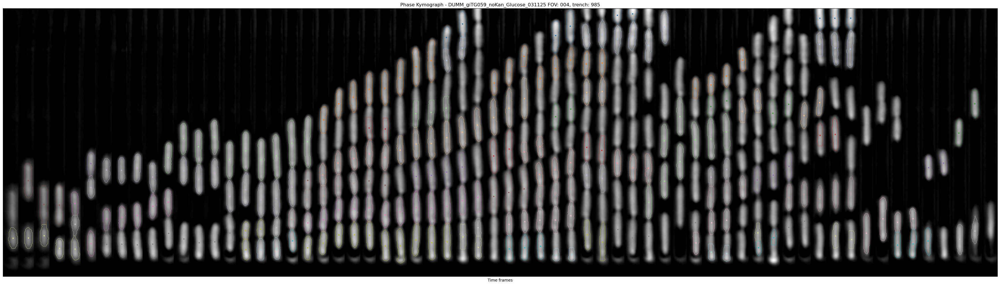

  -> Plotting DUMM_giTG059_noKan_Glucose_031125/004/1061
(360, 1260)


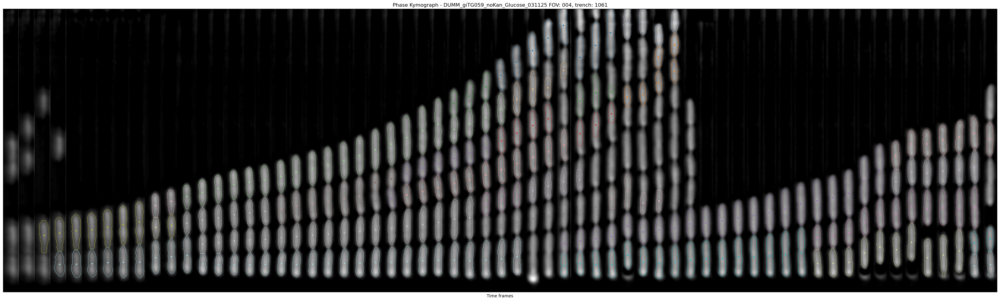

  -> Plotting DUMM_giTG059_noKan_Glucose_031125/004/2276
(345, 1120)


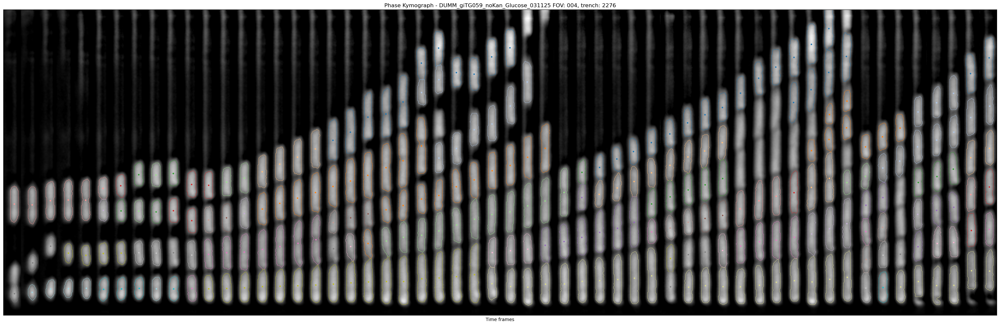

In [13]:
experiment_name = 'DUMM_giTG059_noKan_Glucose_031125'
filterd= all_lineages_df[all_lineages_df['experiment_name'] == experiment_name].copy()
cell1 = filterd[filterd['unique_node_id'] == 'df1_6064'].copy()
base_dir = '/Volumes/mcovert/Instruments/Covert-lab-scope1/subgen_processed_data/'
plot_kymographs(base_dir, filterd)

In [11]:
coords1 = cell1["coords"].iloc[0]
fov = cell1["FOV"].iloc[0]
trench_id = cell1["trench_id"].iloc[0]
experiment_name = cell1["experiment_name"].iloc[0]

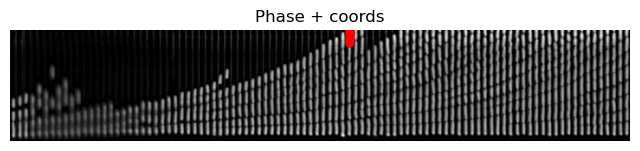

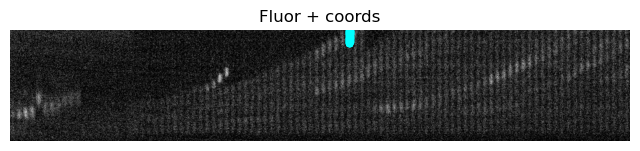

In [12]:
kymo_base_path = os.path.join(base_dir, experiment_name, 'hyperstacked', 'drift_corrected', 'rotated', 'mm_channels','subtracted')

path_to_phase_kymograph = os.path.join(kymo_base_path, f'{fov}_{trench_id}.tif')
path_to_fluor_kymograph = os.path.join(kymo_base_path, 'fluor_kymos', f'{fov}_{trench_id}.tif')  # Assuming 'fluor' subdirectory

phase_kymograph = tifffile.imread(path_to_phase_kymograph)
fluor_kymograph = tifffile.imread(path_to_fluor_kymograph)

coords = np.asarray(coords1)

x = coords[:, 1]
y = coords[:, 0]

fig, ax = plt.subplots(figsize=(8, 6))
ax.imshow(phase_kymograph, cmap="gray")
ax.scatter(x, y, s=15, c="red", marker="o", linewidths=0)
ax.set_title("Phase + coords")
ax.set_axis_off()
plt.show()

fig, ax = plt.subplots(figsize=(8, 6))
ax.imshow(fluor_kymograph, cmap="gray")
ax.scatter(x, y, s=15, c="cyan", marker="o", linewidths=0)
ax.set_title("Fluor + coords")
ax.set_axis_off()
plt.show()